# Analisi dei dati del covid19 in Italia a livello regionale (Aggiornata al 14/02/2020)
>Questa analisi dati è stata svolta prendendo i dati rilasciati dalla protezione civile sul covid19
in Italia.<br>
Autore: Matteo Marulli <br>
Università degli studi di Firenze <br>
Corso di laurea magistrale in Informatica <br>
Curriculum: Data Science<br>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
#import geopandas as 

In [2]:
sns.set()
#sns.set_context("paper")
sns.set_palette("husl")
sns.set_context("paper", rc={"font.size":16,"axes.titlesize":20,"axes.labelsize":20})   

In [3]:
os.getcwd() #caricamento del dataset
os.chdir('/home/matteo/PycharmProjects/Covid19ItalyRegione/data')
covidItalyRegioniDataset = pd.read_csv('dpc-covid19-ita-regioni-update.csv')

In [4]:
print(covidItalyRegioniDataset.info())
covidItalyRegioniDataset.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Data columns (total 16 columns):
data                           420 non-null object
stato                          420 non-null object
codice_regione                 420 non-null int64
denominazione_regione          420 non-null object
lat                            420 non-null float64
long                           420 non-null float64
ricoverati_con_sintomi         420 non-null int64
terapia_intensiva              420 non-null int64
totale_ospedalizzati           420 non-null int64
isolamento_domiciliare         420 non-null int64
totale_attualmente_positivi    420 non-null int64
nuovi_attualmente_positivi     420 non-null int64
dimessi_guariti                420 non-null int64
deceduti                       420 non-null int64
totale_casi                    420 non-null int64
tamponi                        420 non-null int64
dtypes: float64(2), int64(11), object(3)
memory usage: 52.6+ KB
None


,data,stato,codice_regione,denominazione_regione,lat,long,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,totale_attualmente_positivi,nuovi_attualmente_positivi,dimessi_guariti,deceduti,totale_casi,tamponi
0,2020-02-24 18:00:00,ITA,13,Abruzzo,42.351222,13.398438,0,0,0,0,0,0,0,0,0,5
1,2020-02-24 18:00:00,ITA,17,Basilicata,40.639471,15.805148,0,0,0,0,0,0,0,0,0,0
2,2020-02-24 18:00:00,ITA,4,P.A. Bolzano,46.499335,11.356624,0,0,0,0,0,0,0,0,0,1
3,2020-02-24 18:00:00,ITA,18,Calabria,38.905976,16.594402,0,0,0,0,0,0,0,0,0,1
4,2020-02-24 18:00:00,ITA,15,Campania,40.839566,14.250850,0,0,0,0,0,0,0,0,0,10
5,2020-02-24 18:00:00,ITA,8,Emilia Romagna,44.494367,11.341721,10,2,12,6,18,18,0,0,18,148
6,2020-02-24 18:00:00,ITA,6,Friuli Venezia Giulia,45.649435,13.768136,0,0,0,0,0,0,0,0,0,58
7,2020-02-24 18:00:00,ITA,12,Lazio,41.892770,12.483667,1,1,2,0,2,2,1,0,3,124
8,2020-02-24 18:00:00,ITA,7,Liguria,44.411493,8.932699,0,0,0,0,0,0,0,0,0,1
9,2020-02-24 18:00:00,ITA,3,Lombardia,45.466794,9.190347,76,19,95,71,166,166,0,6,172,1463


In [5]:
rows, cols = covidItalyRegioniDataset.shape
variability = []
for column in covidItalyRegioniDataset.columns:
    variability.append(len(covidItalyRegioniDataset[column].unique()))
dataInfo = {'dataType': covidItalyRegioniDataset.dtypes,
            'variability': variability,
            'missingValues': covidItalyRegioniDataset.isna().sum(),
            'missingValuesInRelative': covidItalyRegioniDataset.isna().sum()/rows,
            'missingValuesInPercentual': covidItalyRegioniDataset.isna().sum()*(100/rows)}
dataInformation = pd.DataFrame(data=dataInfo)
dataInformation.head(20)


,dataType,variability,missingValues,missingValuesInRelative,missingValuesInPercentual
data,object,20,0,0.0,0.0
stato,object,1,0,0.0,0.0
codice_regione,int64,20,0,0.0,0.0
denominazione_regione,object,21,0,0.0,0.0
lat,float64,22,0,0.0,0.0
long,float64,22,0,0.0,0.0
ricoverati_con_sintomi,int64,125,0,0.0,0.0
terapia_intensiva,int64,79,0,0.0,0.0
totale_ospedalizzati,int64,133,0,0.0,0.0
isolamento_domiciliare,int64,138,0,0.0,0.0


In [6]:
queryRetrivNumericalData = (dataInformation['dataType']=='int64')| (dataInformation['dataType']=='float64')
numericalData = set(dataInformation[queryRetrivNumericalData].index)

In [7]:
numericalData

{'codice_regione',
 'deceduti',
 'dimessi_guariti',
 'isolamento_domiciliare',
 'lat',
 'long',
 'nuovi_attualmente_positivi',
 'ricoverati_con_sintomi',
 'tamponi',
 'terapia_intensiva',
 'totale_attualmente_positivi',
 'totale_casi',
 'totale_ospedalizzati'}

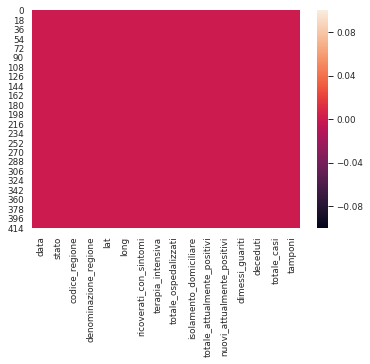

In [8]:
sns.heatmap(data=covidItalyRegioniDataset.isna())

In [9]:
covidItalyRegioniDataset.describe()



,codice_regione,lat,long,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,totale_attualmente_positivi,nuovi_attualmente_positivi,dimessi_guariti,deceduti,totale_casi,tamponi
count,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.00000,420.000000
mean,10.190476,43.044396,12.223691,126.500000,23.378571,149.880952,95.476190,245.354762,42.261905,24.757143,16.561905,286.67381,1929.045238
std,5.801975,2.495209,2.658797,511.541587,79.681029,590.104485,293.128833,859.872217,142.091547,140.265766,87.167731,1079.91597,4832.689287
min,1.000000,38.109228,7.320149,0.000000,0.000000,0.000000,0.000000,0.000000,-63.000000,0.000000,0.000000,0.00000,0.000000
25%,5.000000,41.125596,11.121231,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,2.00000,42.000000
50%,10.000000,43.616760,12.388247,7.000000,0.000000,7.500000,9.000000,17.000000,4.000000,0.000000,0.000000,17.50000,268.000000
75%,15.000000,45.434905,13.768136,43.000000,9.000000,53.500000,62.250000,111.250000,27.000000,2.000000,2.000000,117.00000,1203.500000
max,20.000000,46.499335,16.867367,4898.000000,732.000000,5630.000000,3429.000000,9059.000000,1336.000000,1660.000000,966.000000,11685.00000,37138.000000


### Analisi della matrice di correlazione degli scatter plot
>Dall'analisi della matrice di correllazione apprendiamo che solo codice regione, latidudine, longitudine non hanno correlazione con il fenomeno.
Dalla matrice degli scatterplot invece possiamo visualizzare le varie relazione lineari del fenomeno, per esempio possiamo notare che  ricoverati_con_sintomi, terapia_intensiva, totale_ospedalizzati sono perfettamenti lineari.



In [10]:
matrixCorrelection = covidItalyRegioniDataset.corr()
matrixCorrelection

,codice_regione,lat,long,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,totale_attualmente_positivi,nuovi_attualmente_positivi,dimessi_guariti,deceduti,totale_casi,tamponi
codice_regione,1.000000,-0.959263,0.652487,-0.235724,-0.273348,-0.241245,-0.245516,-0.249260,-0.250943,-0.200037,-0.194585,-0.240159,-0.303387
lat,-0.959263,1.000000,-0.546651,0.195191,0.226580,0.199791,0.228528,0.215021,0.216846,0.160344,0.162639,0.205162,0.274830
long,0.652487,-0.546651,1.000000,-0.208281,-0.235901,-0.212403,-0.169081,-0.203407,-0.203129,-0.177900,-0.171915,-0.198944,-0.168242
ricoverati_con_sintomi,-0.235724,0.195191,-0.208281,1.000000,0.983806,0.999707,0.880841,0.986347,0.894813,0.969295,0.974393,0.989917,0.793271
terapia_intensiva,-0.273348,0.226580,-0.235901,0.983806,1.000000,0.987855,0.879222,0.977661,0.905001,0.950475,0.935467,0.977414,0.827567
totale_ospedalizzati,-0.241245,0.199791,-0.212403,0.999707,0.987855,1.000000,0.882290,0.987042,0.897883,0.968590,0.970982,0.990103,0.799403
isolamento_domiciliare,-0.245516,0.228528,-0.169081,0.880841,0.879222,0.882290,1.000000,0.946388,0.872547,0.848386,0.901715,0.936529,0.879907
totale_attualmente_positivi,-0.249260,0.215021,-0.203407,0.986347,0.977661,0.987042,0.946388,1.000000,0.913641,0.953928,0.973750,0.998740,0.848566
nuovi_attualmente_positivi,-0.250943,0.216846,-0.203129,0.894813,0.905001,0.897883,0.872547,0.913641,1.000000,0.853585,0.858783,0.907664,0.785799
dimessi_guariti,-0.200037,0.160344,-0.177900,0.969295,0.950475,0.968590,0.848386,0.953928,0.853585,1.000000,0.960474,0.966968,0.768075


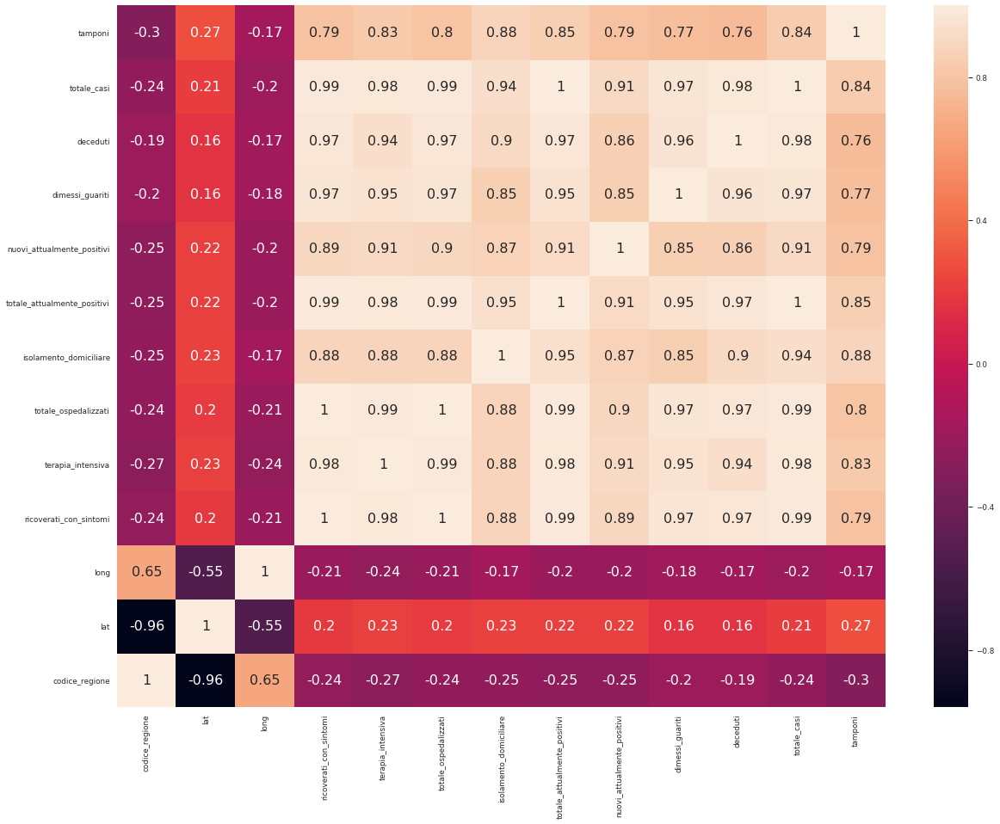

In [11]:
plt.figure(figsize=(20,15))
sns.heatmap(data=matrixCorrelection, annot=True)
plt.ylim([0,13])
plt.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/correlazioneScatterPlot/matriceDiCorrelazione.png', transparent= False, bbox_inches='tight')    

In [12]:
#plt.figure(figsize=(30,30))
#sns.pairplot(data=covidItalyRegioniDataset, height=13, aspect=2)
#plt.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/correlazioneScatterPlot/scatterMatrix.png', transparent= False, bbox_inches='tight')
figReg, axesReg = plt.subplots(nrows=13,ncols=12, figsize=(100,100))
for i, column0 in zip(np.arange(13), numericalData):
    for j, column1 in zip(np.arange(12), numericalData):
        #sns.barplot(x=covidUltimoGiorno[column],y=covidUltimoGiorno['denominazione_regione'],ax=axes1[i])
        if(column0!=column1):
            sns.regplot(x=column0, y=column1, data = covidItalyRegioniDataset, ax = axesReg[i,j])
        else:
             sns.distplot(covidItalyRegioniDataset[column0], ax = axesReg[i,j])
    figReg.tight_layout()
figReg.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/correlazioneScatterPlot/scatterMatrix.png', transparent= False, bbox_inches='tight')    

In [13]:
covidItalyRegioniDataset['data'] = pd.to_datetime(covidItalyRegioniDataset['data'])
covidItalyRegioniDataset.head(20)

,data,stato,codice_regione,denominazione_regione,lat,long,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,totale_attualmente_positivi,nuovi_attualmente_positivi,dimessi_guariti,deceduti,totale_casi,tamponi
0,2020-02-24 18:00:00,ITA,13,Abruzzo,42.351222,13.398438,0,0,0,0,0,0,0,0,0,5
1,2020-02-24 18:00:00,ITA,17,Basilicata,40.639471,15.805148,0,0,0,0,0,0,0,0,0,0
2,2020-02-24 18:00:00,ITA,4,P.A. Bolzano,46.499335,11.356624,0,0,0,0,0,0,0,0,0,1
3,2020-02-24 18:00:00,ITA,18,Calabria,38.905976,16.594402,0,0,0,0,0,0,0,0,0,1
4,2020-02-24 18:00:00,ITA,15,Campania,40.839566,14.250850,0,0,0,0,0,0,0,0,0,10
5,2020-02-24 18:00:00,ITA,8,Emilia Romagna,44.494367,11.341721,10,2,12,6,18,18,0,0,18,148
6,2020-02-24 18:00:00,ITA,6,Friuli Venezia Giulia,45.649435,13.768136,0,0,0,0,0,0,0,0,0,58
7,2020-02-24 18:00:00,ITA,12,Lazio,41.892770,12.483667,1,1,2,0,2,2,1,0,3,124
8,2020-02-24 18:00:00,ITA,7,Liguria,44.411493,8.932699,0,0,0,0,0,0,0,0,0,1
9,2020-02-24 18:00:00,ITA,3,Lombardia,45.466794,9.190347,76,19,95,71,166,166,0,6,172,1463


### Esplorazione dei dati con i barplot
>La regione Lombardia è la regione più colpita dal virus Covid19, seguita dall'Emilia Romagna e il Veneto. <br>
In quest'ultima osserviamo che il fenomeno è più contenuto rispetto a Lombardia e Emilia Romagna, infatti il numero 
di casi totali, decessi, isolamenti domiciliari e il resto degli altri fattori in esame è più basso.<br>
Va fatto notare che il numero di tamponi  usati in Veneto è oltre 14000, numero che si avvicina al numero di tamponi 
fatti dalla Lombardia (oltre 16000) al fronte dei 600 casi totali.<br>
Pertanto il Veneto è stata la regione più preparata nel gestire il fenomeno tra le tre più colpite. <br>
L'Emilia Romagna non ha numeri paragonabile a quelli della Lombardia dove la situazione è più grave
ma ha numeri che se confronati con quelli del Veneto nei rispettivi indicatori come numeri dei  nuovi_attualmente_positivi, dimessi_guariti,
il totale dei casi ecc... sono il doppio di quelli del veneto e se guardiamo il  numero di decessi il Veneto ne conta meno
di 20 mentre contro i circa 50 dell'emilia e la situazione dei guariti  è quasi uguali per le due regioni.<br>
Si può dire quindi che tra le tre regioni più colpite l'Emilia Romagnia sia la regione meno efficiente ha gestire il 
fenomeno.<br>
Per le altre regioni al momento il fenomeno è poco accentuato.


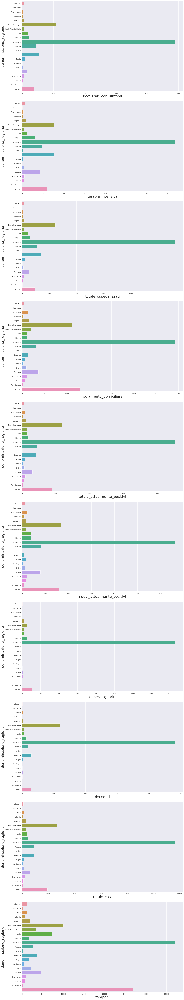

In [14]:
lastDay = covidItalyRegioniDataset['data'].max()
covidUltimoGiorno =covidItalyRegioniDataset[covidItalyRegioniDataset['data']==lastDay]
informationForRegione = ['ricoverati_con_sintomi', 'terapia_intensiva', 'totale_ospedalizzati', 'isolamento_domiciliare',
              'totale_attualmente_positivi','nuovi_attualmente_positivi', 'dimessi_guariti',
              'deceduti', 'totale_casi', 'tamponi']
fig1, axes1 = plt.subplots(nrows=10,ncols=1, figsize=(15,80))
for i, column in zip(np.arange(10), informationForRegione):
    sns.barplot(x=covidUltimoGiorno[column],y=covidUltimoGiorno['denominazione_regione'],ax=axes1[i])
    fig1.tight_layout()
fig1.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/barplot/barplot.png', transparent= False, bbox_inches='tight')    

### Esplorazione dei dati temporali
>Abbiamo visto dai bar plot che le regioni più colpite sono Lombardia, Emilia Romagna e Veneto.<br>
Ora faremo un'analisi esplorativa usando il tempo per vedere come il fenomeno si evoluto in queste regioni sotto i
vari indicatori presi in analisi.<br>
Cominciamo dalla Lombardia, come possiamo vedere l'andamento dei ricoveri_con_sintomi,
terapia_intensiva e totali_ospedalizzati hanno un andamento crescente molto veloce e simile tra di loro,
questo perchè i tre indicatori sono altamente correllati tra loro (si guardi la matrice di
di correlazione e degli scatterplot) quindi questi indicatori danno la stessa informazione. <br>
E'interresante notare che tra il 2020-03-05 e il 2020-03-06 gli isolamenti_domiciliari 
passano da 400 persone all'isolamento domiciliare a 100 persone all'isolamento domiciliare per poi risalire a 700 il 2020-03-07.
Per quanto riguarda gli altri fattori in analisi come tamponi, dimessi_guariti, decessi,casi_totali ecc.. crescescono tutti a velocità 
diverse.<br>
Guardando il grafico temporale riepilogativo della regione Lombardia fino al 2020-03-07 è evidente l'epidemia ha fatto  crescere nelle diverse misure tutti questi indicatori allo scorrere del tempo; lo stesso vale per l'Emilia Romagnia, <br>
Il Veneto come detto nella precedente analisi è la regione più preparata ed infatti l'analisi temporale (fino al 2020-03-07) conferma il fatto, in quanto in tutte le dimensioni di analisi si vede un andamento crescente ma rispetto a Lombardia e Emilia Romagna questo è più regolare, più lento.<br>
Gli alti grafici mettono in confronto Lombardia, Veneto e Emilia Romagna, quello finale confronta tutte le regioni Italiane.

/home/matteo/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


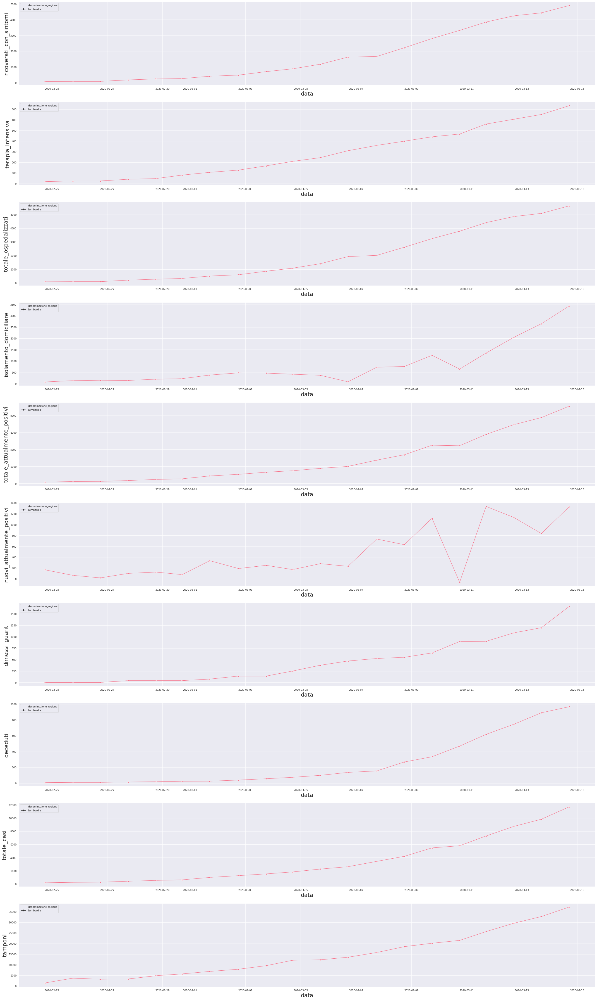

In [15]:
lombardyCase = covidItalyRegioniDataset[covidItalyRegioniDataset['denominazione_regione']=='Lombardia']
fig2, axis2 = plt.subplots(nrows=10,ncols=1, figsize=(30,50))
for i, column in zip(np.arange(10), informationForRegione):
    sns.lineplot(x='data', y=column, markers=True,style='denominazione_regione', data = lombardyCase, ax = axis2[i])
    fig2.tight_layout()
fig2.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/timeSeries/timeSeriesLombardia.png', transparent= False, bbox_inches='tight')    

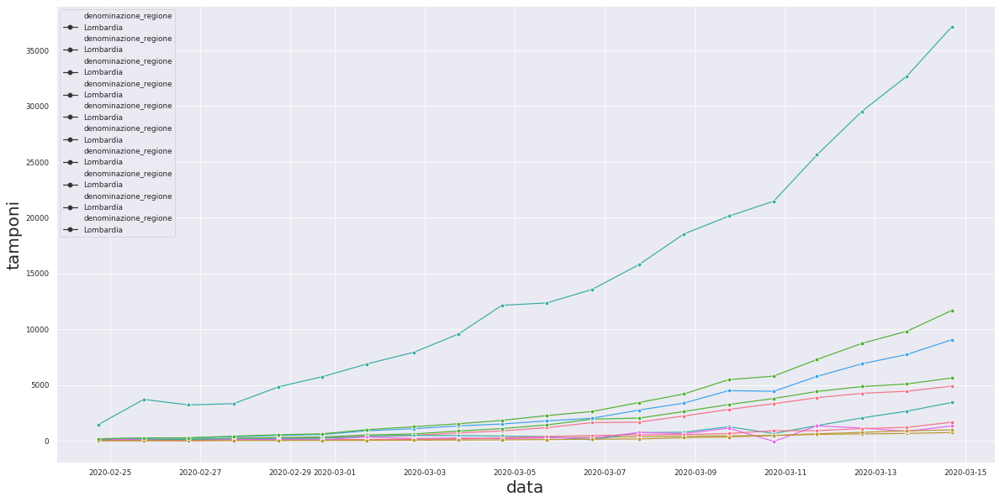

In [16]:
plt.figure(figsize=(20,10))
for column in informationForRegione:
    sns.lineplot(x='data', y=column, style='denominazione_regione', markers=True, data = lombardyCase)
plt.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/timeSeries/timeSeriesLombardiaQuadroGenerale.png', transparent= False, bbox_inches='tight')    

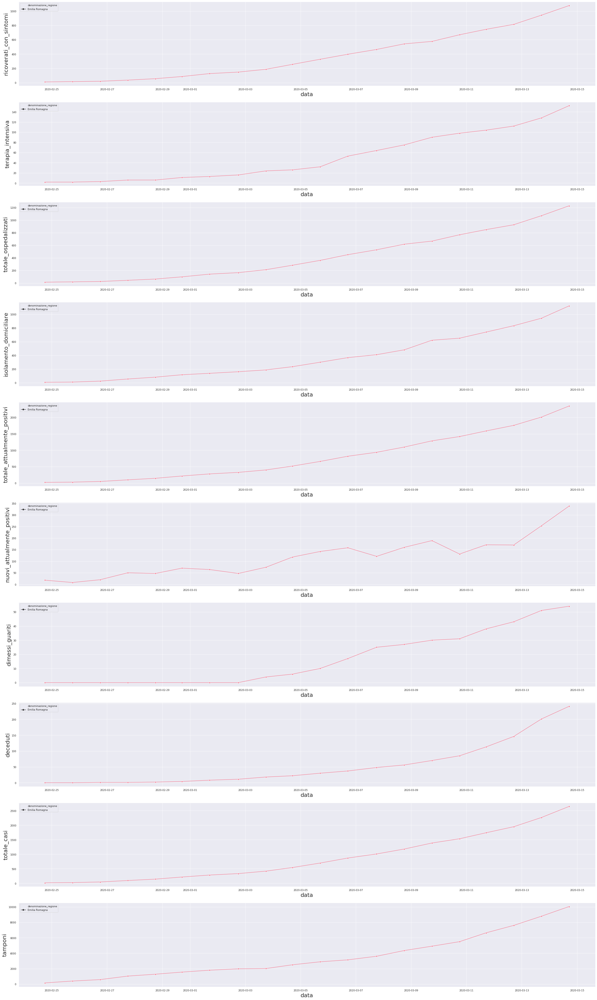

In [17]:
emiliaCase = covidItalyRegioniDataset[covidItalyRegioniDataset['denominazione_regione']=='Emilia Romagna']
fig3, axis3 = plt.subplots(nrows=10,ncols=1, figsize=(30,50))
for i, column in zip(np.arange(10), informationForRegione):
    sns.lineplot(x='data', y=column, markers=True,style='denominazione_regione', data = emiliaCase, ax = axis3[i])
    fig3.tight_layout()
fig3.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/timeSeries/timeSeriesEmiliaRomagna.png', transparent= False, bbox_inches='tight')    

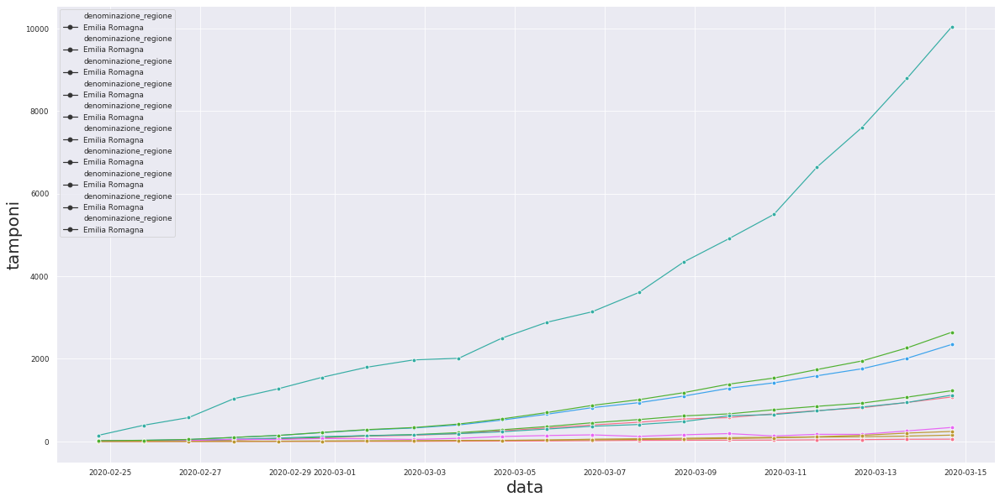

In [18]:
plt.figure(figsize=(20,10))
for column in informationForRegione:
    sns.lineplot(x='data', y=column, markers=True,style='denominazione_regione', data = emiliaCase)
plt.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/timeSeries/timeSeriesEmiliaRomagnaQuadroGenerale.png', transparent= False, bbox_inches='tight')    

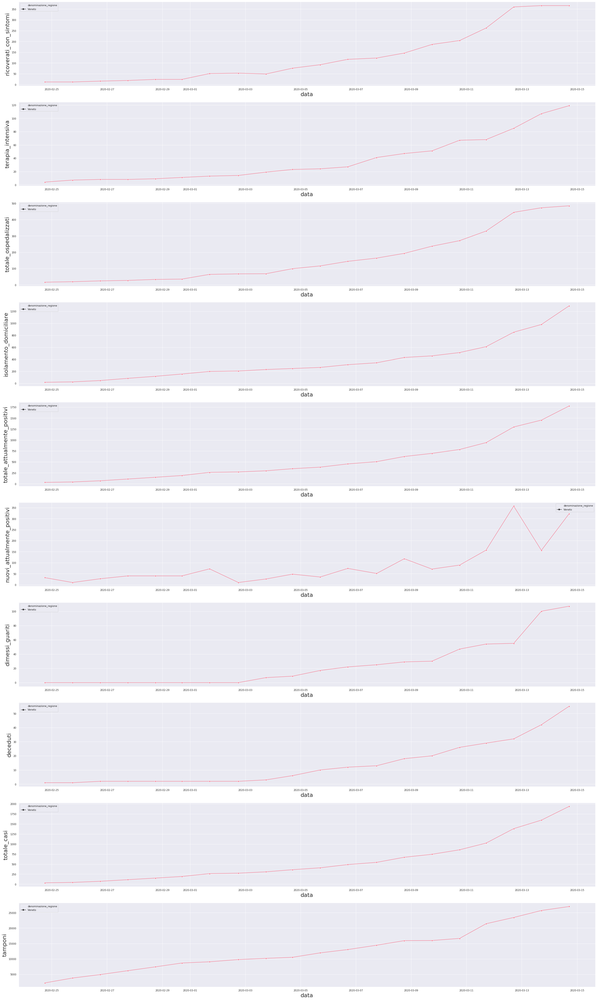

In [19]:
venetoCase = covidItalyRegioniDataset[covidItalyRegioniDataset['denominazione_regione']=='Veneto']
fig4, axis4 = plt.subplots(nrows=10,ncols=1, figsize=(30,50))
for i, column in zip(np.arange(10), informationForRegione):
    sns.lineplot(x='data', y=column, markers=True, style='denominazione_regione',data = venetoCase, ax = axis4[i])
    fig4.tight_layout()
fig4.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/timeSeries/timeSeriesVeneto.png', transparent= False, bbox_inches='tight')    

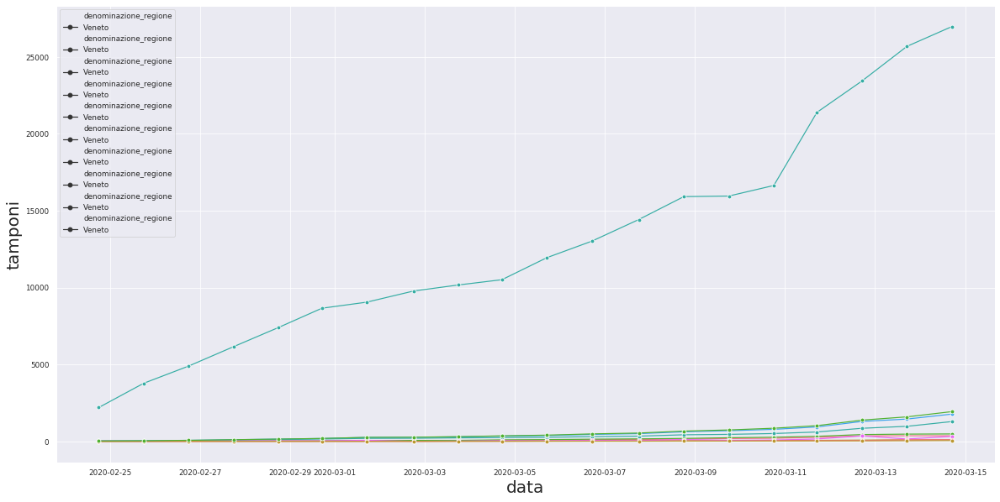

In [20]:
plt.figure(figsize=(20,10))
for column in informationForRegione:
    sns.lineplot(x='data', y=column, markers=True, style='denominazione_regione', data = venetoCase)
plt.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/timeSeries/timeSeriesVenetoQuadroGenerale.png', transparent= False, bbox_inches='tight')    

In [21]:
whereCondition = (covidItalyRegioniDataset['denominazione_regione']=='Lombardia')|(covidItalyRegioniDataset['denominazione_regione']=='Veneto')|\
(covidItalyRegioniDataset['denominazione_regione']=='Emilia Romagna')
comparisonLVE = covidItalyRegioniDataset[whereCondition]

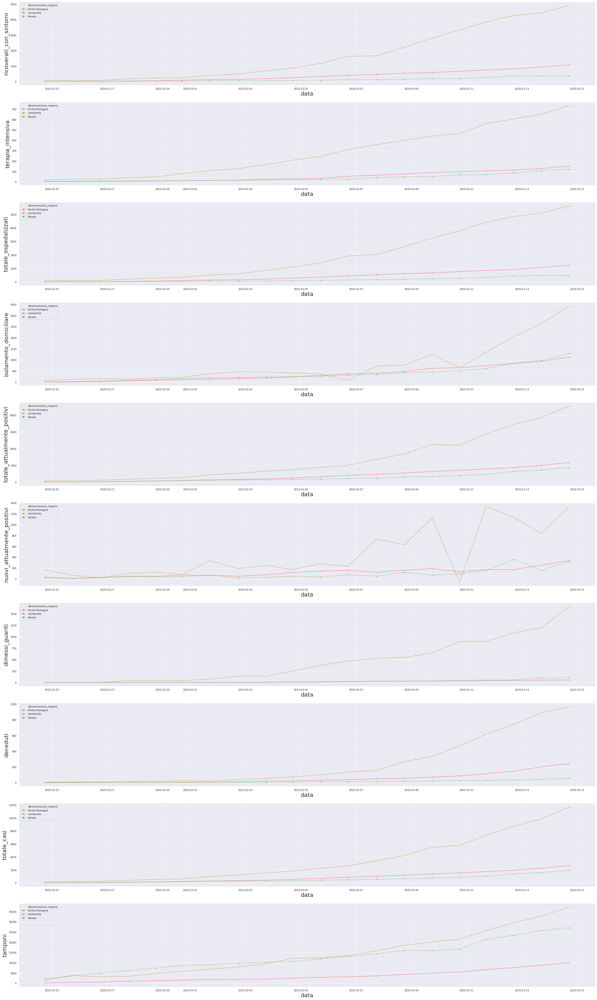

In [22]:
fig5, axis5 = plt.subplots(nrows=10,ncols=1, figsize=(30,50))
for i, column in zip(np.arange(10), informationForRegione):
    sns.lineplot(x='data', y=column, markers=True, style='denominazione_regione', hue='denominazione_regione', data = comparisonLVE, ax = axis5[i])
    fig5.tight_layout()
fig5.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/timeSeries/timeSeriesConfrontoRegioniPiuColpite.png', transparent= False, bbox_inches='tight')    

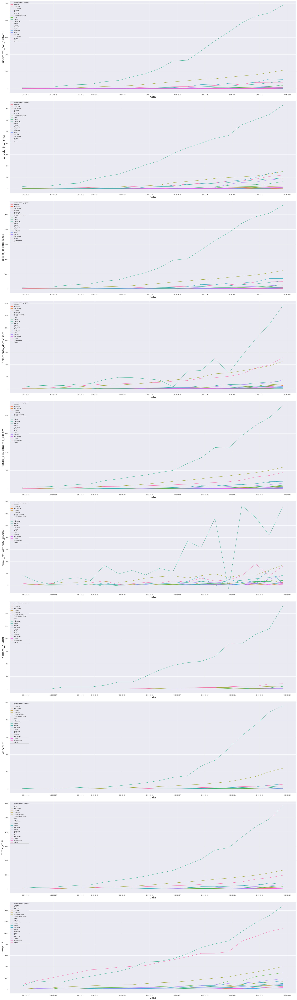

In [23]:
fig6, axis6 = plt.subplots(nrows=10,ncols=1, figsize=(30,100))
for i, column in zip(np.arange(10), informationForRegione):
    sns.lineplot(x='data', y=column, hue='denominazione_regione', data = covidItalyRegioniDataset, ax = axis6[i])
    fig6.tight_layout()
fig6.savefig('/home/matteo/PycharmProjects/Covid19ItalyRegione/img/timeSeries/timeSeriesItalia.png', transparent= False, bbox_inches='tight')    


### Analisi dei dati con il modello ARIMA
>Adesso vediamo di costruire un modello per analizzare a modino le nostre serie temporali.<br>
Vogliamo capire come si evolvera la situazione dei totale_ospedalizzati che ricordiamo tale variabile include
le persone ricoverate in ospedale con i sintomi e quelle gravemente malate da finire in terapia intensiva.<br>
Lo faremo per la sola regione Lombardia perchè è quella con più rilevazioni essendo la più colpita dal Covid19.<br>
Per fare la nostra analisi useremo il modello stocastico ARIMA (modello autoregressivo integrato a media mobile) tale modello è definito come: 
$$(1- \sum_{k=1}^{p}\alpha_{k}L^{k})(1-L)^{d}X_{t}=(1+\sum_{k=1}^{q}\beta_{k}L^{k})\epsilon_{t}$$
dove:
* $\epsilon_{t}$ è l'errore
* p è l'ordine della parte autoregressiva del modello
* q è l'ordine della parte media mobile del modello
* L è l'operatore di lag <br>

>Utilizzeremo il modello ARIMA in quest'ordine:
* Visualizzazione della serie temporale
* Controllo della stazionarietà con il test Dickey-Fullert e di Kwiatkowski-Phillips-Schmidt-Shin ed eventuale trasformazione di stazionarietà
* Plotting dei grafici di autocorrelazione e autocorrelazione parziale
* Generazione del modello ARIMA attraverso grid search 
* Analisi del modello
* Previsione <br>
>Perchè ci interessa la stazionarità e l'autocorrelazione?<br>
Una serie temporale stazionaria è più facile da analizzare e prevedere in quanto si può assumere che le propietà statistiche future
della serie temporale saranno uguali a quelle attuali.<br>
Molte serie temporali non sono stazionarie ma esistono dei metodi che ci permettono di trasformare una serie temporale non stazionaria in una
stazionaria.<br>
L'autocorrelazione ci interessa perchè se ignorata ci porta a conclusione errate sull'impatto delle variabili del nostro modello.

In [24]:
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs
import matplotlib.pyplot as plt
import statsmodels.api as sm
from pylab import rcParams
#from pyramid.arima import auto_arima
import warnings
warnings.filterwarnings("ignore")
from statsmodels.tsa.stattools import adfuller, kpss

In [25]:
def tsplot(y, lags=None, figsize=(10, 8), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        #mpl.rcParams['font.family'] = 'Ubuntu Mono'
        layout = (3, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        qq_ax = plt.subplot2grid(layout, (2, 0))
        pp_ax = plt.subplot2grid(layout, (2, 1))
        
        y.plot(ax=ts_ax) # disegna la time series
        ts_ax.set_title('Time Series Analysis Plots')
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.5) #mostra l'autocorrelazione
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.5) #mostra l'autocorrelazione parziale
        sm.qqplot(y, line='s', ax=qq_ax) #mostra il qq-plot
        qq_ax.set_title('QQ Plot')
        scs.probplot(y, sparams=(y.mean(), y.std()), plot=pp_ax) #mostra il probability plot

        plt.tight_layout()
    return

In [26]:
def test_stationarity(timeseries):

    #Determing rolling statistics
    rolmean = timeseries.rolling(3).mean()
    rolstd = timeseries.rolling(3).std()
    #df.rolling(2).sum()

    #Plot rolling statistics:
    fig = plt.figure(figsize=(12, 8))
    orig = plt.plot(timeseries.to_numpy(), color='blue',label='Original')
    mean = plt.plot(rolmean.to_numpy(), color='red', label='Rolling Mean')
    std = plt.plot(rolstd.to_numpy(), color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput) 

In [27]:
def kpss_test(timeseries):
    print ('Results of KPSS Test:')
    kpsstest = kpss(timeseries, regression='c')
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    print (kpss_output)

Per prima cosa settiamo l'indice del nostro dataframe covidItalyRegioniDataset in modo che sia la variabile data, questo ci permetterà di osservare secondo il tempo le nostre variabili.<br>
Dal dataframe estraiamo i totali_ospedalizzati della Lombardia, questa sarà la nostra serie temporale.


In [28]:
copyCovidItalyRegioniDataset = covidItalyRegioniDataset.copy()
copyCovidItalyRegioniDataset.set_index(['data'], inplace = True)
#totale_ospedalizzati = copyCovidItalyRegioniDataset['totale_ospedalizzati']

In [29]:
copyCovidItalyRegioniDataset


,stato,codice_regione,denominazione_regione,lat,long,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,totale_attualmente_positivi,nuovi_attualmente_positivi,dimessi_guariti,deceduti,totale_casi,tamponi
data,,,,,,,,,,,,,,,
2020-02-24 18:00:00,ITA,13,Abruzzo,42.351222,13.398438,0,0,0,0,0,0,0,0,0,5
2020-02-24 18:00:00,ITA,17,Basilicata,40.639471,15.805148,0,0,0,0,0,0,0,0,0,0
2020-02-24 18:00:00,ITA,4,P.A. Bolzano,46.499335,11.356624,0,0,0,0,0,0,0,0,0,1
2020-02-24 18:00:00,ITA,18,Calabria,38.905976,16.594402,0,0,0,0,0,0,0,0,0,1
2020-02-24 18:00:00,ITA,15,Campania,40.839566,14.250850,0,0,0,0,0,0,0,0,0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-03-14 17:00:00,ITA,9,Toscana,43.769231,11.255889,160,87,247,367,614,159,10,6,630,4595
2020-03-14 17:00:00,ITA,4,P.A. Trento,46.068935,11.121231,68,12,80,119,199,42,5,2,206,1006
2020-03-14 17:00:00,ITA,10,Umbria,43.106758,12.388247,21,11,32,71,103,30,3,1,107,748


In [30]:
totale_ospedalizzati_lombardia = copyCovidItalyRegioniDataset[copyCovidItalyRegioniDataset['denominazione_regione']=="Lombardia"]['totale_ospedalizzati']

In [31]:
totale_ospedalizzati_lombardia

data
2020-02-24 18:00:00      95
2020-02-25 18:00:00     104
2020-02-26 18:00:00     104
2020-02-27 18:00:00     213
2020-02-28 18:00:00     282
2020-02-29 17:00:00     336
2020-03-01 17:00:00     512
2020-03-02 18:00:00     605
2020-03-03 18:00:00     865
2020-03-04 17:00:00    1086
2020-03-05 17:00:00    1413
2020-03-06 17:00:00    1931
2020-03-07 18:00:00    2020
2020-03-08 18:00:00    2616
2020-03-09 18:00:00    3242
2020-03-10 18:00:00    3785
2020-03-11 17:00:00    4412
2020-03-12 17:00:00    4852
2020-03-13 17:00:00    5085
2020-03-14 17:00:00    5630
Name: totale_ospedalizzati, dtype: int64

Adesso plottiamo la serie temporale, la scompporemo nelle componenti di trend, stagionalità e residuo per creare un modello moltiplicativo e addattivo.

Come possiamo vedere da entrambe le decomposizioni c'è un trend non lineare (quasi esponenziale) nella serie storica e non vi è stagionalità nel fenomeno.

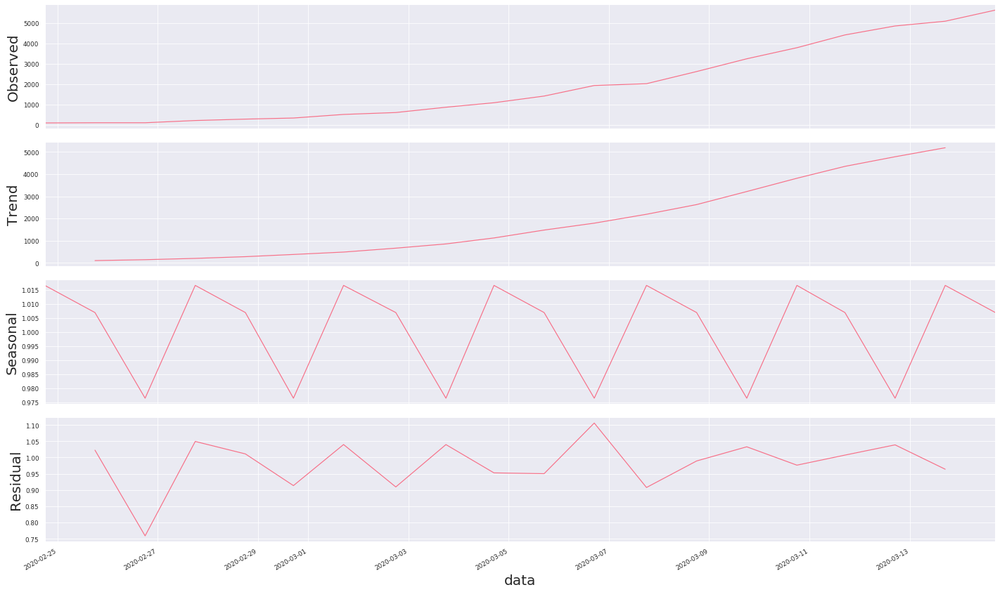

In [32]:
rcParams['figure.figsize'] = 20, 12
decomposition_multiplicative = sm.tsa.seasonal_decompose(totale_ospedalizzati_lombardia, model='multiplicative', filt=None, two_sided=True, freq=3) # freq=1
fig = decomposition_multiplicative.plot()
#plt.show()

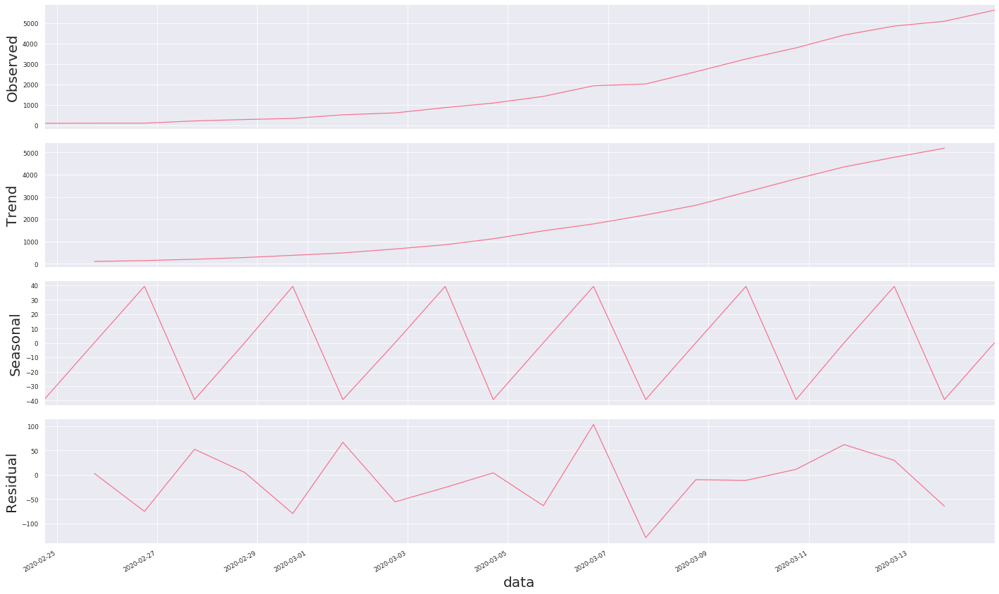

In [33]:
rcParams['figure.figsize'] = 20, 12
decomposition_additive = sm.tsa.seasonal_decompose(totale_ospedalizzati_lombardia, model='additive', filt=None, two_sided=True, freq=3) # freq=1
fig = decomposition_additive.plot()

>Adesso dobbiamo verificare la stazionarietà della nostra serie temporale (che sappiamo già non esserlo, basta guardarla!) con il test di Dickey-Fuller, tale test è formulato come segue:
* H0: la serie temporale ha una radice unitaria
* H1: la serie temporale non ha una radice unitaria<br>
>Se non riusciamo a respingere H0 (p-value più grande di 0.05) possiamo dire che la serie temporale è non stazionaria e quindi la nostra serie potrebbe essere lineare 
che la nostra serie temporale ha una radice unitaria (ciò significa che la nostra serie temporale è non stazionaria), il p-value associato al test è 0.99, pertanto concludiamo che la nostra serie ha
una radice unitaria, dobbiamo renderla stazionaria. <br>
Se non riusciamo a respingere l'ipotesi nulla, possiamo dire che la serie non è stazionaria e che possiamo renderla stazionaria applicando delle differenze regolari e attraverso una trasformazione logaritmica.
Un altro test utile è il test di Kwiatkowski-Phillips-Schmidt-Shin che è il complementare del test di Dickey-Fuller infatti questo test è definito come:
* H0: la serie temporale è stazionaria
* H1: la serie temporale non è stazionaria<br>
>Come detto è il complementare del test di Dickey-Fuller quindi se non riusciamo a respingere H0 (p-value più grande di 0.05) possiamo dire che la serie temporale è stazionaria e quindi non dovremmo fare nulla
che la nostra serie temporale ha una radice unitaria (ciò significa che la nostra serie temporale è non stazionaria), il p-value associato al test è 0.99, pertanto concludiamo che la nostra serie ha
una radice unitaria, dobbiamo renderla stazionaria. <br>
Abbiamo fatto diversi tentativi per rendere stazionaria la serie temporale, il miglior risultato si è ottenuto con una differenza regolare del secondo ordine definita nel seguente modo:
$$\Delta^{2}x_t= x_{t}-2x_{t-1}+x_{t-2}$$
Abbiamo cominciato con la serie temporale senza trasformazioni plottando la sua media mobile e la sua standard deviation

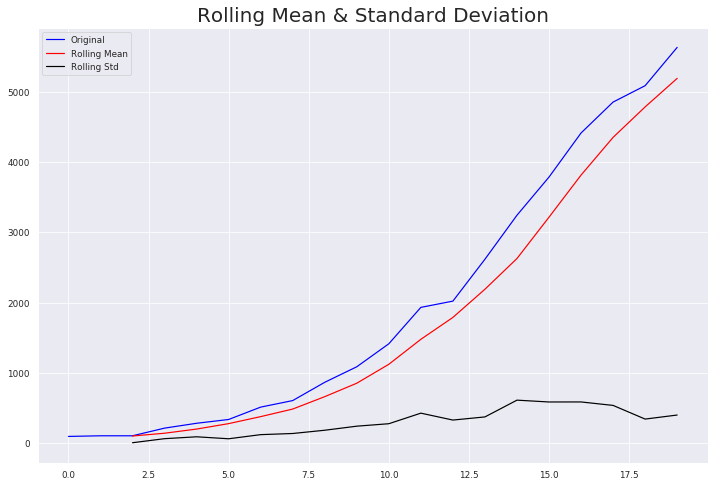

Results of Dickey-Fuller Test:
Test Statistic                 -3.318218
p-value                         0.014083
#Lags Used                      8.000000
Number of Observations Used    11.000000
Critical Value (1%)            -4.223238
Critical Value (5%)            -3.189369
Critical Value (10%)           -2.729839
dtype: float64
Results of KPSS Test:
Test Statistic           0.364793
p-value                  0.092331
Lags Used                9.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64


In [34]:
test_stationarity(totale_ospedalizzati_lombardia)
kpss_test(totale_ospedalizzati_lombardia)

>$$\Delta^{2}x_t= x_{t}-2x_{t-1}+x_{t-2}$$
Come possiamo vedere il test di Dickey-Fuller Test ha un p-value di 0.000029 quindi la nostra serie non ha una radice unitaria mentre per il test di Kwiatkowski-Phillips-Schmidt-Shin il p-value associato è 0.076197.
Al fine di rendere stazionaria la serie temporale basta che il Dickey-Fuller Test rigetti la sua ipotesi nulla.

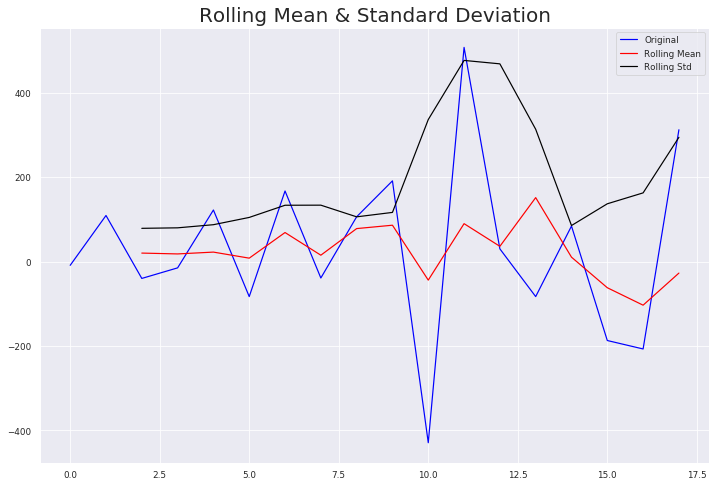

Results of Dickey-Fuller Test:
Test Statistic                 -4.998511
p-value                         0.000022
#Lags Used                      1.000000
Number of Observations Used    16.000000
Critical Value (1%)            -3.924019
Critical Value (5%)            -3.068498
Critical Value (10%)           -2.673893
dtype: float64
Results of KPSS Test:
Test Statistic           0.219191
p-value                  0.100000
Lags Used                8.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64


In [35]:
totale_ospedalizzati_lombardia_second_order =totale_ospedalizzati_lombardia - 2*totale_ospedalizzati_lombardia.shift(1) +totale_ospedalizzati_lombardia.shift(2)
test_stationarity(totale_ospedalizzati_lombardia_second_order.dropna(inplace=False))
kpss_test(totale_ospedalizzati_lombardia_second_order.dropna(inplace=False))

>Adesso andiamo a determinare attraverso una grid search il modello ARIMA per trovare i migliori valori per parametri p, d, q usando il criterio AIC (Akaike's information criterion),il modello che ha il valore AIC più basso
è il migliore

aic: 231.92050 | order: (5, 2, 0)


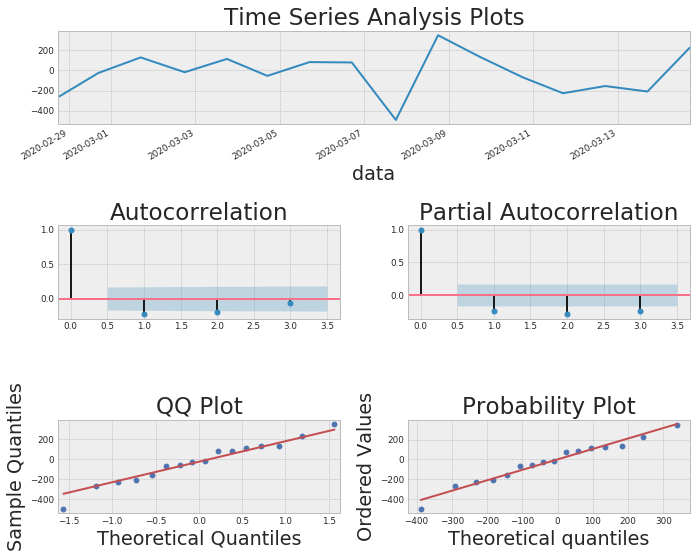

In [36]:
 #Fit ARIMA(p, d, q) model to SPY Returns
# pick best order and final model based on aic

best_aic = np.inf 
best_order = None
best_mdl = None

pq_rng = range(8) 
d_rng = range(8) 
for i in pq_rng:
    for d in d_rng:
        for j in pq_rng:
            try:
                tmp_mdl = smt.ARIMA(totale_ospedalizzati_lombardia_second_order.dropna(inplace=False), order=(i,d,j)).fit(method='mle', trend='nc')
                tmp_aic = tmp_mdl.aic
                if tmp_aic < best_aic:
                    best_aic = tmp_aic
                    best_order = (i, d, j)
                    best_mdl = tmp_mdl
            except: continue


print('aic: {:6.5f} | order: {}'.format(best_aic, best_order))
# aic: -11518.22902 | order: (4, 0, 4)

# ARIMA model resid plot
_ = tsplot(best_mdl.resid, lags=3)




>Il grafico di autocorrelazione ci dice che prevale la parte stocastica della serie temporale ciò vuol dire che la serie non è significativamente correlata con le serie ritardate, ovvero che il passato non "spiega" il presente e che le variazioni da un istante o periodo ad un altro sono sostanzialmente casuali.

In [37]:
print(best_mdl.summary())

                                ARIMA Model Results                                
Dep. Variable:     D2.totale_ospedalizzati   No. Observations:                   16
Model:                      ARIMA(5, 2, 0)   Log Likelihood                -109.960
Method:                                mle   S.D. of innovations            193.215
Date:                     Sun, 15 Mar 2020   AIC                            231.920
Time:                             14:16:53   BIC                            236.556
Sample:                                  2   HQIC                           232.158
                                                                                   
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
ar.L1.D2.totale_ospedalizzati    -2.0089      0.232     -8.657      0.000      -2.464      -1.554
ar.L2.D2.totale_ospedalizzati    -

>Guardando l'output del modello i coefficienti associati della parte autoregressiva sono tutti significativi in quanto i p-values associati ai rispettivi test sono inferiori al livello di significatività $\alpha= 0.05$
e per riconferma della validità del modello creato si può guardare anche gli estremi degli intervalli di confidenza per i due parametri lo zero non appartiene a tali intervalli quindi i coefficienti della parte autoregressiva sono significativi.<br>
Anche il criterio BIC (criterio bayesiano) è vicino al valore del AIC, quindi se avessimo scelto il BIC come criterio saremmo arrivati allo stesso modello.

In [38]:
covidItalyRegioniDataset['data'].min()

Timestamp('2020-02-24 18:00:00')

In [39]:
covidItalyRegioniDataset['data'].max()

Timestamp('2020-03-14 17:00:00')

In [40]:
covidItalyRegioniDataset[covidItalyRegioniDataset['data']==lastDay]

,data,stato,codice_regione,denominazione_regione,lat,long,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,totale_attualmente_positivi,nuovi_attualmente_positivi,dimessi_guariti,deceduti,totale_casi,tamponi
399,2020-03-14 17:00:00,ITA,13,Abruzzo,42.351222,13.398438,51,14,65,41,106,23,4,2,112,1232
400,2020-03-14 17:00:00,ITA,17,Basilicata,40.639471,15.805148,0,2,2,8,10,0,0,0,10,155
401,2020-03-14 17:00:00,ITA,4,P.A. Bolzano,46.499335,11.356624,26,7,33,137,170,47,0,3,173,1135
402,2020-03-14 17:00:00,ITA,18,Calabria,38.109228,15.643453,22,4,26,33,59,22,1,0,60,711
403,2020-03-14 17:00:00,ITA,15,Campania,40.839566,14.250850,72,17,89,154,243,30,23,6,272,1936
404,2020-03-14 17:00:00,ITA,8,Emilia Romagna,44.494367,11.341721,1076,152,1228,1121,2349,338,54,241,2644,10043
405,2020-03-14 17:00:00,ITA,6,Friuli Venezia Giulia,45.649435,13.768136,67,11,78,193,271,35,17,13,301,3376
406,2020-03-14 17:00:00,ITA,12,Lazio,41.892770,12.483667,181,25,206,114,320,78,24,13,357,7335
407,2020-03-14 17:00:00,ITA,7,Liguria,44.411493,8.932699,213,62,275,109,384,80,52,27,463,1750
408,2020-03-14 17:00:00,ITA,3,Lombardia,45.466794,9.190347,4898,732,5630,3429,9059,1327,1660,966,11685,37138


In [54]:
regioni = set(covidItalyRegioniDataset["denominazione_regione"].unique())
for regione in regioni:
    covidItalyRegioniDataset[covidItalyRegioniDataset['denominazione_regione']==regione].to_csv('/home/matteo/PycharmProjects/Covid19ItalyRegione/data/dataFramePerRegione/formatoCsv'+regione+".csv")

In [55]:
for regione in regioni:
    covidItalyRegioniDataset[covidItalyRegioniDataset['denominazione_regione']==regione].to_Excel('/home/matteo/PycharmProjects/Covid19ItalyRegione/data/dataFramePerRegione/formatoExcel'+regione+".xlsx")

In [ ]:
for regione in regioni:
    covidItalyRegioniDataset[covidItalyRegioniDataset['denominazione_regione']==regione].to_json('/home/matteo/PycharmProjects/Covid19ItalyRegione/data/dataFramePerRegione/formatoJson'+regione+".json")